Predict whether income exceeds $50K/yr based on census data. Also known as "Census Income" dataset.

- age: continuous.
- workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.
- fnlwgt: continuous.
- education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
- education-num: continuous.
- marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
- occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
- relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
- race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
- sex: Female, Male.
- capital-gain: continuous.
- capital-loss: continuous.
- hours-per-week: continuous.
- native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

 Description of fnlwgt (final weight)


 The weights on the CPS files are controlled to independent estimates of the
 civilian noninstitutional population of the US.  These are prepared monthly
 for us by Population Division here at the Census Bureau.  We use 3 sets of
 controls.

  These are:
          1.  A single cell estimate of the population 16+ for each state.
          2.  Controls for Hispanic Origin by age and sex.
          3.  Controls by Race, age and sex.

 We use all three sets of controls in our weighting program and "rake" through
 them 6 times so that by the end we come back to all the controls we used.

 The term estimate refers to population totals derived from CPS by creating
 "weighted tallies" of any specified socio-economic characteristics of the
 population.

 People with similar demographic characteristics should have
 similar weights.  There is one important caveat to remember
 about this statement.  That is that since the CPS sample is
 actually a collection of 51 state samples, each with its own
 probability of selection, the statement only applies within
 state.

http://archive.ics.uci.edu/ml/machine-learning-databases/adult/

In [43]:
from IPython.display import Markdown, display

import pandas as pd
import numpy as np

%matplotlib inline

In [44]:
df1 = pd.read_csv('adult.csv', skipinitialspace = True, na_values = ['?'], names = ['age','workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 
                                                      'sex', 'capital_gain', 'capital_loss','hours_per_week','native_country', 'income'])

df2 = pd.read_csv('adult_test.csv', skipinitialspace = True, na_values = ['?'], names = ['age','workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 
                                                      'sex', 'capital_gain', 'capital_loss','hours_per_week','native_country', 'income'])
dframes = [df1,df2]
df = pd.concat(dframes)
df.head(3)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K


In [45]:
df.shape

(48842, 15)

In [46]:
df.isnull().values.any()

True

In [47]:
df= df.dropna()
df.head(3)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K


In [48]:
d = {'Private': 1, 'Self-emp-not-inc': 2, 'Self-emp-inc': 3, 'Federal-gov': 4, 'Local-gov': 5, 'State-gov': 6, 'Without-pay': 7, 'Never-worked': 8}
df['workclass'] = df['workclass'].map(d)

#education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.
d = {'Bachelors': 1, 'Some-college': 2, '11th': 3, 'HS-grad': 4, 'Prof-school': 5, 'Assoc-acdm': 6, 'Assoc-voc': 7, '9th': 8, '7th-8th': 9, '12th':10, 'Masters':11, '1st-4th':12, '10th':13 , 'Doctorate': 14, '5th-6th': 15, 'Preschool': 16}
df['education'] = df['education'].map(d)

# marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.
e = {'Married-civ-spouse': 1, 'Divorced': 2, 'Never-married': 3, 'Separated': 4, 'Widowed': 5, 'Married-spouse-absent': 6,
     'Married-AF-spouse': 7}
df['marital_status'] = df['marital_status'].map(e)

# occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, 
# Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.
d = {'Tech-support':1, 'Craft-repair':2, 'Other-service':3, 'Sales':4, 'Exec-managerial':5, 'Prof-specialty':6, 'Handlers-cleaners':7, 'Machine-op-inspct':8, 'Adm-clerical':9, 'Farming-fishing':10, 'Transport-moving':11, 'Priv-house-serv':12, 'Protective-serv':13, 'Armed-Forces':14}
df['occupation'] = df['occupation'].map(d)

# relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.
d = {'Wife': 1, 'Own-child': 2, 'Husband': 3, 'Not-in-family': 4, 'Other-relative': 5, 'Unmarried': 6}
df['relationship'] = df['relationship'].map(d)

# race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.
d = {'White': 1, 'Asian-Pac-Islander': 2, 'Amer-Indian-Eskimo': 3, 'Other': 4, 'Black': 5}
df['race'] = df['race'].map(d)

# sex: Female, Male.
d = {'Female': 1, 'Male': 2}
df['sex'] = df['sex'].map(d)

# native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India,
#     Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, 
# Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, 
# Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.
d = {'United-States':1, 'Cambodia':2, 'England':3, 'Puerto-Rico':4, 'Canada':5, 'Germany':6, 'Outlying-US(Guam-USVI-etc)':7, 'India':8,
'Japan':9, 'Greece':10, 'South':11, 'China':12, 'Cuba':13, 'Iran':14, 'Honduras':15, 'Philippines':16, 'Italy':17, 'Poland':18, 
'Jamaica':19, 'Vietnam':20, 'Mexico':21, 'Portugal':22, 
'Ireland':23, 'France':24, 'Dominican-Republic':25, 'Laos':26, 'Ecuador':27, 'Taiwan':28, 'Haiti':29, 'Columbia':30,
     'Hungary':31, 'Guatemala':32, 'Nicaragua':33, 'Scotland':34, 
'Thailand':35, 'Yugoslavia':36, 'El-Salvador':37, 'Trinadad&Tobago':38, 'Peru':39, 'Hong':40, 'Holand-Netherlands':41}
df['native_country'] = df['native_country'].map(d)

d = {'<=50K': 0, '>50K': 1}
df['income'] = df['income'].map(d)

df.head(10)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,6,77516,1,13,3,9,4,1,2,2174,0,40,1,0.0
1,50,2,83311,1,13,1,5,3,1,2,0,0,13,1,0.0
2,38,1,215646,4,9,2,7,4,1,2,0,0,40,1,0.0
3,53,1,234721,3,7,1,7,3,5,2,0,0,40,1,0.0
4,28,1,338409,1,13,1,6,1,5,1,0,0,40,13,0.0
5,37,1,284582,11,14,1,5,1,1,1,0,0,40,1,0.0
6,49,1,160187,8,5,6,3,4,5,1,0,0,16,19,0.0
7,52,2,209642,4,9,1,5,3,1,2,0,0,45,1,1.0
8,31,1,45781,11,14,3,6,4,1,1,14084,0,50,1,1.0
9,42,1,159449,1,13,1,5,3,1,2,5178,0,40,1,1.0


In [49]:
df= df.dropna()

In [50]:
df.isnull().values.any()

False

In [51]:
df.describe()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
count,30162.000000,30162.000000,3.016200e+04,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000,30162.000000
mean,38.437902,1.736788,1.897938e+05,4.372820,10.121312,2.053213,5.742159,3.393276,1.445196,1.675685,1092.007858,88.372489,40.931238,2.515583,0.248922
std,13.134665,1.461908,1.056530e+05,3.429379,2.549995,1.170881,2.978754,1.229789,1.196958,0.468126,7406.346497,404.298370,11.979984,5.641075,0.432396
min,17.000000,1.000000,1.376900e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,28.000000,1.000000,1.176272e+05,2.000000,9.000000,1.000000,3.000000,3.000000,1.000000,1.000000,0.000000,0.000000,40.000000,1.000000,0.000000
50%,37.000000,1.000000,1.784250e+05,4.000000,10.000000,2.000000,5.000000,3.000000,1.000000,2.000000,0.000000,0.000000,40.000000,1.000000,0.000000
75%,47.000000,2.000000,2.376285e+05,5.000000,13.000000,3.000000,8.000000,4.000000,1.000000,2.000000,0.000000,0.000000,45.000000,1.000000,0.000000
max,90.000000,7.000000,1.484705e+06,16.000000,16.000000,7.000000,14.000000,6.000000,5.000000,2.000000,99999.000000,4356.000000,99.000000,41.000000,1.000000


In [52]:

#here resetting all the features to the original list of  features
all_features = df[['age','workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 
                                                      'sex', 'capital_gain', 'capital_loss','hours_per_week','native_country']].values


all_classes = df['income'].values

feature_names = ['age','workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 
                                                      'sex', 'capital_gain', 'capital_loss','hours_per_week','native_country']

all_features

array([[    39,      6,  77516, ...,      0,     40,      1],
       [    50,      2,  83311, ...,      0,     13,      1],
       [    38,      1, 215646, ...,      0,     40,      1],
       ...,
       [    58,      1, 151910, ...,      0,     40,      1],
       [    22,      1, 201490, ...,      0,     20,      1],
       [    52,      3, 287927, ...,      0,     40,      1]], dtype=int64)

In [53]:
# !pip install mlrose

In [54]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler()
all_features_scaled = scaler.fit_transform(all_features)
all_features_scaled

C:\Users\maria\AppData\Local\Enthought\Canopy\edm\envs\User\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



array([[ 0.04279571,  2.91624496, -1.0627216 , ..., -0.21858598,
        -0.07773411, -0.26867354],
       [ 0.88028814,  0.18004984, -1.00787131, ..., -0.21858598,
        -2.3315307 , -0.26867354],
       [-0.03333996, -0.50399894,  0.24469349, ..., -0.21858598,
        -0.07773411, -0.26867354],
       ...,
       [ 1.48937355, -0.50399894, -0.3585745 , ..., -0.21858598,
        -0.07773411, -0.26867354],
       [-1.25151078, -0.50399894,  0.11070545, ..., -0.21858598,
        -1.74721307, -0.26867354],
       [ 1.0325595 ,  0.86409862,  0.92884082, ..., -0.21858598,
        -0.07773411, -0.26867354]])

In [55]:
from sklearn.tree import DecisionTreeClassifier
import numpy
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.cross_validation import cross_val_score
from sklearn import cross_validation
from sklearn import tree


(X_train,
 X_test,
 y_train,
 y_test) = cross_validation.train_test_split(all_features_scaled, all_classes, train_size=0.80, random_state=0)

In [56]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.cluster import MeanShift
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, FastICA

In [57]:
#!pip install plotly

In [58]:
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

In [59]:
analyser = KMeans(n_clusters=4)
analyser.fit(df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [60]:
cols = df.columns[1:]

In [61]:
cols

Index(['workclass', 'fnlwgt', 'education', 'education_num', 'marital_status',
       'occupation', 'relationship', 'race', 'sex', 'capital_gain',
       'capital_loss', 'hours_per_week', 'native_country', 'income'],
      dtype='object')

In [62]:
cluster = KMeans(n_clusters=4)

In [63]:
cluster.fit_predict(df)

array([2, 2, 0, ..., 0, 0, 3])

In [64]:
df["cluster"]=cluster.fit_predict(df)

In [65]:
dframe = df

In [66]:
dframe.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,cluster
0,39,6,77516,1,13,3,9,4,1,2,2174,0,40,1,0.0,3
1,50,2,83311,1,13,1,5,3,1,2,0,0,13,1,0.0,3
2,38,1,215646,4,9,2,7,4,1,2,0,0,40,1,0.0,1
3,53,1,234721,3,7,1,7,3,5,2,0,0,40,1,0.0,1
4,28,1,338409,1,13,1,6,1,5,1,0,0,40,13,0.0,0


In [67]:
ica = FastICA(n_components=2)
df["X"] = ica.fit_transform(df[cols])[:,0]
df["Y"] = ica.fit_transform(df[cols])[:,1]
df = df.reset_index()

In [68]:
df.head()

,index,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,cluster,X,Y
0,0,39,6,77516,1,13,3,9,4,1,2,2174,0,40,1,0.0,3,-0.000847,0.006119
1,1,50,2,83311,1,13,1,5,3,1,2,0,0,13,1,0.0,3,0.000844,0.005804
2,2,38,1,215646,4,9,2,7,4,1,2,0,0,40,1,0.0,1,0.000850,-0.001409
3,3,53,1,234721,3,7,1,7,3,5,2,0,0,40,1,0.0,1,0.000851,-0.002448
4,4,28,1,338409,1,13,1,6,1,5,1,0,0,40,13,0.0,0,0.000856,-0.008099


In [69]:
#creating a new dataframe
dfclusters = df[["index","cluster","X","Y"]]

In [70]:
dfclusters.tail()

,index,cluster,X,Y
30157,32556,0,0.000852,-0.003679
30158,32557,1,0.000847,0.001931
30159,32558,1,0.000847,0.002065
30160,32559,1,0.000849,-0.000637
30161,32560,0,-0.010827,-0.005354


In [29]:
trace0 = go.Scatter(x = dfclusters[dfclusters.cluster == 0]["X"],
                    y = dfclusters[dfclusters.cluster == 0]["Y"],
                    #z = dfclusters[dfclusters.cluster == 0]["Z"],
                    name = "Cluster 1",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "red",
                                  line = dict(width = 1, color = "red")))

trace1 = go.Scatter(x = dfclusters[dfclusters.cluster == 1]["X"],
                    y = dfclusters[dfclusters.cluster == 1]["Y"],
                    #z = dfclusters[dfclusters.cluster == 1]["Z"],

                    name = "Cluster 2",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "blue",
                                  line = dict(width = 1, color = "blue")))

# trace2 = go.Scatter(x = dfclusters[dfclusters.cluster == 2]["X"],
#                     y = dfclusters[dfclusters.cluster == 2]["Y"],
#                     #z = dfclusters[dfclusters.cluster == 2]["Z"],
#                     name = "Cluster 3",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "green",
#                                   line = dict(width = 1, color = "green")))

# trace3 = go.Scatter(x = dfclusters[dfclusters.cluster == 3]["X"],
#                     y = dfclusters[dfclusters.cluster == 3]["Y"],
#                     #z = dfclusters[dfclusters.cluster == 3]["Z"],
#                     name = "Cluster 4",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "black",
#                                   line = dict(width = 1, color = "black")))

# trace4 = go.Scatter(x = dfclusters[dfclusters.cluster == 4]["X"],
#                     y = dfclusters[dfclusters.cluster == 4]["Y"],
#                     #z = dfclusters[dfclusters.cluster == 4]["Z"],
#                     name = "Cluster 5",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "gray",
#                                   line = dict(width = 1, color = "gray")))

data = [trace0, trace1]

iplot(data)

# , trace3, trace4

In [71]:
trace0 = go.Scatter(x = dfclusters[dfclusters.cluster == 0]["X"],
                    y = dfclusters[dfclusters.cluster == 0]["Y"],
                    #z = dfclusters[dfclusters.cluster == 0]["Z"],
                    name = "Cluster 1",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "red",
                                  line = dict(width = 1, color = "red")))

trace1 = go.Scatter(x = dfclusters[dfclusters.cluster == 1]["X"],
                    y = dfclusters[dfclusters.cluster == 1]["Y"],
                    #z = dfclusters[dfclusters.cluster == 1]["Z"],

                    name = "Cluster 2",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "blue",
                                  line = dict(width = 1, color = "blue")))

trace2 = go.Scatter(x = dfclusters[dfclusters.cluster == 2]["X"],
                    y = dfclusters[dfclusters.cluster == 2]["Y"],
                    #z = dfclusters[dfclusters.cluster == 2]["Z"],
                    name = "Cluster 3",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "green",
                                  line = dict(width = 1, color = "green")))

trace3 = go.Scatter(x = dfclusters[dfclusters.cluster == 3]["X"],
                    y = dfclusters[dfclusters.cluster == 3]["Y"],
                    #z = dfclusters[dfclusters.cluster == 3]["Z"],
                    name = "Cluster 4",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "black",
                                  line = dict(width = 1, color = "black")))

# trace4 = go.Scatter(x = dfclusters[dfclusters.cluster == 4]["X"],
#                     y = dfclusters[dfclusters.cluster == 4]["Y"],
#                     #z = dfclusters[dfclusters.cluster == 4]["Z"],
#                     name = "Cluster 5",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "gray",
#                                   line = dict(width = 1, color = "gray")))

data = [trace0, trace1, trace2, trace3]

iplot(data)

# , trace3, trace4

K-means

In [30]:
analyser = KMeans()
analyser.fit(df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

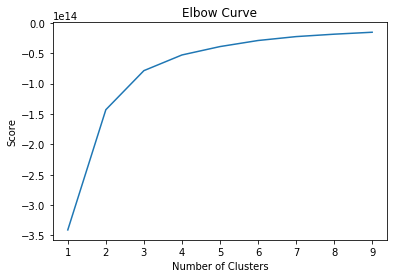

In [31]:
import pylab as pl

Nc = range(1, 10)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(df).score(df) for i in range(len(kmeans))]
score

pl.plot(Nc,score)

pl.xlabel('Number of Clusters')

pl.ylabel('Score')

pl.title('Elbow Curve')

pl.show()

In [32]:
kmeans = KMeans(n_clusters=2, random_state=0)
clusters = kmeans.fit_predict(df)
kmeans.cluster_centers_.shape

(2, 19)

In [33]:
cols = df.columns[1:]

In [34]:
cols


Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income', 'cluster', 'X', 'Y'],
      dtype='object')

In [35]:
cluster = KMeans(n_clusters=2)

In [36]:
cluster.fit_predict(df)

array([1, 1, 1, ..., 1, 1, 0])

In [37]:
df["cluster"]=cluster.fit_predict(df)

In [38]:
df_new = df

In [39]:
kmeans = KMeans(n_clusters=2)

df["X"] = kmeans.fit_transform(df[cols])[:,0]
df["Y"] = kmeans.fit_transform(df[cols])[:,1]


df = df.reset_index()

In [40]:
dfclusters = df[["index","cluster","X","Y"]]

In [41]:
dfclusters.head()

,index,cluster,X,Y
0,0,0,64416.879494,308361.508809
1,1,0,58623.612427,306043.031975
2,2,0,73730.384206,190375.720569
3,3,1,92803.656693,163401.385876
4,4,1,196488.130171,16801.819214


In [42]:
trace0 = go.Scatter(x = dfclusters[dfclusters.cluster == 0]["X"],
                    y = dfclusters[dfclusters.cluster == 0]["Y"],
                    name = "Cluster 1",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "red",
                                  line = dict(width = 1, color = "red")))

trace1 = go.Scatter(x = dfclusters[dfclusters.cluster == 1]["X"],
                    y = dfclusters[dfclusters.cluster == 1]["Y"],
                    name = "Cluster 2",
                    mode = "markers",
                    marker = dict(size = 5,
                                  color = "blue",
                                  line = dict(width = 1, color = "blue")))

# trace2 = go.Scatter(x = dfclusters[dfclusters.cluster == 2]["X"],
#                     y = dfclusters[dfclusters.cluster == 2]["Y"],
#                     name = "Cluster 3",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "green",
#                                   line = dict(width = 1, color = "green")))

# trace3 = go.Scatter(x = dfclusters[dfclusters.cluster == 3]["X"],
#                     y = dfclusters[dfclusters.cluster == 3]["Y"],
#                     name = "Cluster 4",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "black",
#                                   line = dict(width = 1, color = "black")))

# trace4 = go.Scatter(x = dfclusters[dfclusters.cluster == 4]["X"],
#                     y = dfclusters[dfclusters.cluster == 4]["Y"],
#                     name = "Cluster 5",
#                     mode = "markers",
#                     marker = dict(size = 5,
#                                   color = "gray",
#                                   line = dict(width = 1, color = "gray")))



data = [trace0, trace1]

iplot(data)